# 텍스트 벡터화: 표현 대상에서 방법 선택까지

컴퓨터 모델은 문자열의 의미를 그대로 계산하지 못하므로 텍스트를 숫자 배열로 바꾸는 **텍스트 벡터화(Text Vectorization)** 가 필요하다.
같은 원문이라도 어떤 대상을 하나의 벡터로 만들고 어떤 정보를 보존하느냐에 따라 적합한 방법이 달라진다.


## 01. 벡터화란?

**벡터(Vector)** 는 순서가 있는 숫자의 모음이다.
모델은 벡터의 각 위치에 있는 값을 곱하고 더하며 패턴을 학습할 수 있지만, `축구`나 `인공지능` 같은 문자열 자체를 바로 계산하지는 못한다.
**벡터화(Vectorization)** 는 텍스트의 필요한 정보를 숫자 위치와 값으로 옮겨 모델 입력을 만드는 과정이다.

토큰화와 정규화는 텍스트를 일정한 단위로 나누고 표기를 정리하는 준비 단계이고,
벡터화는 준비된 토큰이나 문서를 실제 숫자 배열로 변환한다.

```text
원문
  → 토큰화·정규화
  → 무엇을 하나의 벡터로 만들지 결정
  → 보존할 정보에 맞는 벡터화 방법 선택
  → 숫자 벡터
  → 분류·검색·군집·신경망 모델
```

예를 들어 문서 세 개를 어휘 열 열다섯 개로 표현하면 문서-특성 행렬의 shape은 `(3, 15)`가 된다. 행 하나인 문서 벡터의 shape은 `(15,)`이다.
행은 문서 수이고 열은 벡터화 방법이 정한 특성이다. 벡터화 기법을 이해하려면 값만 보지 않고 각 축이 무엇을 뜻하는지 먼저 확인해야 한다.

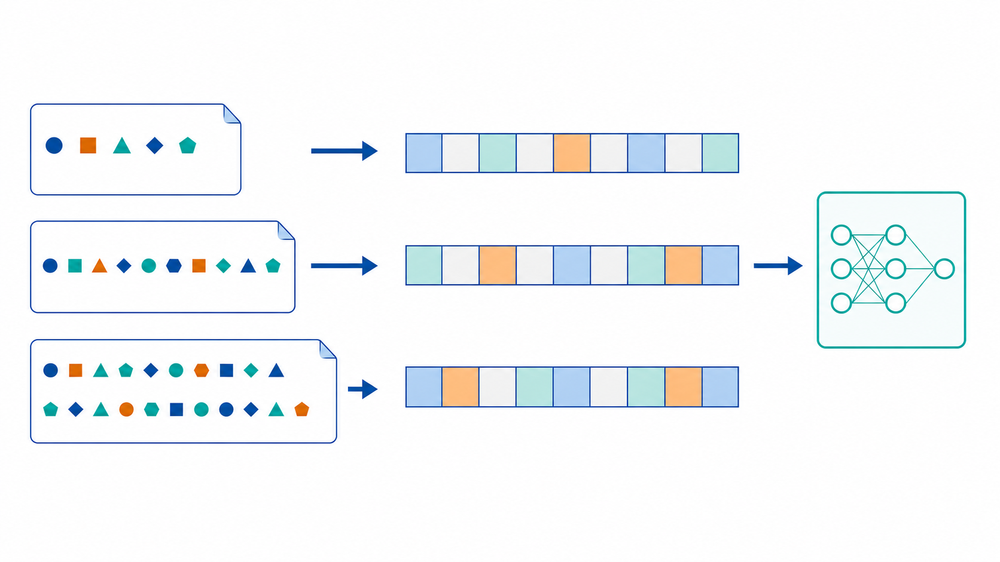

그림에서 길이가 서로 다른 문서가 같은 축을 사용하는 숫자 표현으로 바뀐다. 같은 축을 사용해야 서로 다른 문서의 같은 위치를 비교하고 하나의 모델에 함께 입력할 수 있다.

벡터화 방법을 읽을 때는 다음 네 가지를 확인한다.

- **표현 대상**: 벡터 한 개가 토큰, 단어, 문장, 문서 중 무엇을 나타내는지 확인한다.
- **축의 의미**: 각 위치가 실제 단어에 대응하는지, 학습된 잠재 차원에 대응하는지 확인한다.
- **값의 의미**: 값이 등장 횟수, 중요도, 확률, 학습된 실수 좌표 중 무엇인지 확인한다.
- **보존 정보**: 빈도, 짧은 순서, 단어 의미, 문맥, 문서 주제 중 무엇을 남기고 무엇을 잃는지 확인한다.

벡터화는 문자열을 숫자로 바꾸는 모든 방법을 포함하는 넓은 개념이다. 따라서 BoW·TF-IDF처럼 규칙으로 값을 계산하는 방법도 벡터화이고, 데이터에서 의미 표현을 학습하는 임베딩도 벡터화이다.

![image.png](attachment:4d91506b-b41d-4af4-92fa-1d69e992db7c.png)

## 02. 벡터화 기법의 세 가지 분류 기준

벡터화 기법을 비교할 때 모든 용어를 하나의 분류표에 넣으면 흐름이 섞인다. 다음 세 질문은 서로 다른 기준이며, 한 기법을 여러 관점에서 동시에 설명할 수 있다.

### 02-01. 무엇을 하나의 벡터로 만드는가

- **토큰·서브워드 표현**: 단어 유사도 계산이나 신경망의 토큰 입력을 위한 벡터
- **문서 표현**: 문장이나 문서 전체를 분류·검색·군집하기 위한 벡터

토큰 벡터가 항상 같은 값을 사용하는지 문맥마다 달라지는지는 표현 대상이 아니라 뒤에서 비교할 표현 방식의 차이이다.
단어 벡터를 모아 문서 벡터를 만들 수도 있으므로 토큰 표현과 문서 표현은 서로 배타적으로 나뉘지 않는다.
중요한 것은 현재 표현에서 벡터 한 행이 토큰 하나인지 문서 하나인지 먼저 구분하는 것이다.

### 02-02. 숫자 값의 구조는 희소한가 밀집한가

**희소 벡터(Sparse Vector)** 는 대부분의 값이 0인 고차원 벡터이다. BoW·TF-IDF·원-핫은 어휘가 커질수록 차원이 증가하고 많은 위치가 0으로 남는다.

**밀집 벡터(Dense Vector)** 는 비교적 짧은 여러 위치에 실수 값이 분포한 벡터이다. 임베딩과 잠재 공간 표현이 대표적이지만, 값이 촘촘하다는 사실만으로 의미 관계를 학습했다고 판단할 수는 없다.

### 02-03. 정보는 한 위치에 대응하는가 여러 차원에 나뉘는가

**지역적 표현(Local Representation)** 은 각 위치가 특정 단어나 특성에 직접 대응한다. 원-핫의 한 위치와 BoW·TF-IDF의 어휘 열이 대표적인 예이다.

**분산 표현(Distributed Representation)** 은 표현 대상 하나의 정보를 여러 차원에 나누어 담는다. **연속적 표현(Continuous Representation)** 은 값이 연속적인 실수 공간에 놓인다는 뜻이다. 실제 임베딩은 대개 두 성질을 함께 가지지만, 분산 표현은 정보 배치 방식이고 연속적 표현은 값의 공간을 설명하므로 완전히 같은 기준으로 볼 수 없다. Word2Vec 이후의 임베딩이 대표적인 예이다.

희소·밀집은 0의 비율과 숫자 구조를 설명하고, 지역적·분산적은 정보가 차원에 배치되는 방식을 설명한다. 원-핫과 BoW·TF-IDF는 일반적으로 희소하면서 지역적이고, 단어 임베딩은 일반적으로 밀집하면서 분산적이다. 그러나 TF-IDF가 실수 가중치를 사용한다고 해서 분산 표현이 되는 것은 아니므로 두 기준을 같은 뜻으로 등치하지 않는다.

```text
원-핫              → 단어 대상   / 희소 / 지역적
BoW·TF-IDF         → 문서 대상   / 희소 / 지역적 어휘 축
Word2Vec·GloVe     → 단어 대상   / 밀집 / 분산적·연속적
FastText           → 단어 대상   / 밀집 / 문자 조각을 이용한 분산 표현
BERT               → 문맥적 토큰 / 밀집 / 문맥 의존 분산 표현
Doc2Vec            → 문서 대상   / 밀집 / 분산적·연속적
LSA·LDA            → 문서 대상   / 저차원 잠재 표현
```

## 03. 문서를 표현하는 빈도 기반 방법(BoW, TF-IDF, 단어 N-gram)

문서를 벡터로 표현하는 첫 기준선은 문서가 어떤 단어를 얼마나 사용했는지 숫자로 만드는 것이다.
이 흐름에서는 문서 하나가 벡터 하나가 되고, 벡터의 각 열은 특정 단어나 연속 단어 묶음에 대응한다.

### BoW: 단어의 등장 횟수를 센다

**BoW(Bag of Words)** 는 문서에서 각 단어가 등장한 횟수를 센다. 구현과 해석이 단순하지만 단어 순서를 대부분 잃고, 모든 문서에 자주 나오는 일반적인 단어가 큰 값을 가질 수 있다.

전체 문서에서 어휘 목록을 먼저 만든 뒤, 문서마다 같은 어휘 순서로 등장 횟수를 기록한다. 따라서 벡터의 열 하나는 특정 단어에 직접 대응하고, 문서가 달라도 같은 열은 같은 단어를 뜻한다. 단어 순서만 다른 두 문서는 같은 BoW 벡터가 될 수 있다.

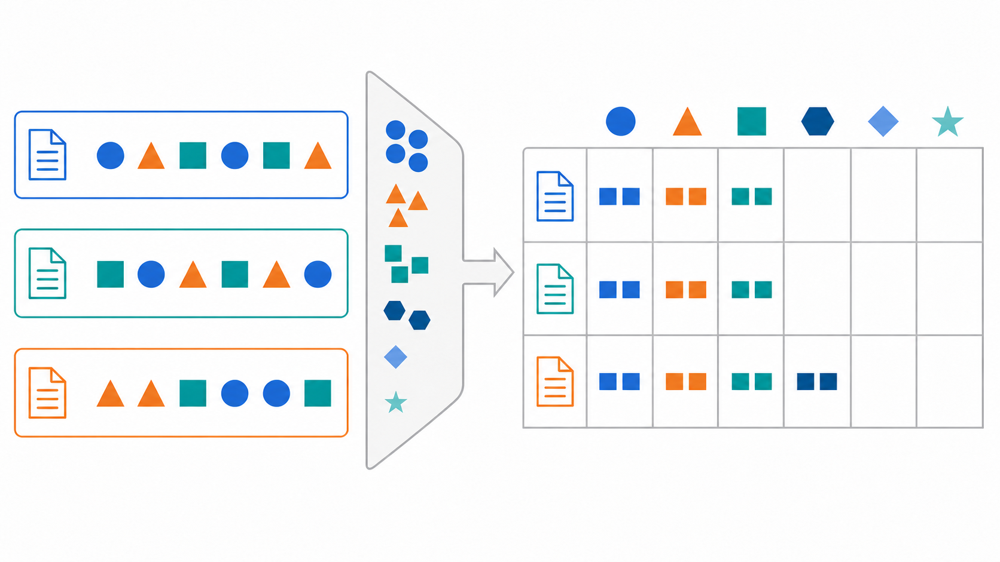

그림의 문서 카드가 행이 되고 공통 어휘가 열이 되며, 진한 셀일수록 해당 문서에서 그 단어가 더 많이 등장했음을 나타낸다.

### TF-IDF: 문서를 구분하는 단어를 강조한다

**TF-IDF(Term Frequency-Inverse Document Frequency)** 는 BoW와 같은 문서-어휘 축을 유지하면서 한 문서에서는 자주 나오고 전체 문서에서는 드문 단어에 더 큰 가중치를 준다. 새로운 의미 축을 학습하는 것이 아니라 기존 어휘 열의 중요도를 다시 계산하는 방법이다.

**TF(Term Frequency)** 는 한 문서 안에서 단어가 얼마나 자주 등장하는지 나타내고, **IDF(Inverse Document Frequency)** 는 여러 문서에 널리 등장하는 단어의 가중치를 낮춘다. 두 값을 결합하면 모든 문서에 흔한 단어보다 특정 문서를 구분하는 단어가 상대적으로 강조된다. TF-IDF도 열이 실제 단어에 대응하므로 단어 의미나 긴 문맥을 스스로 학습하지는 않는다.

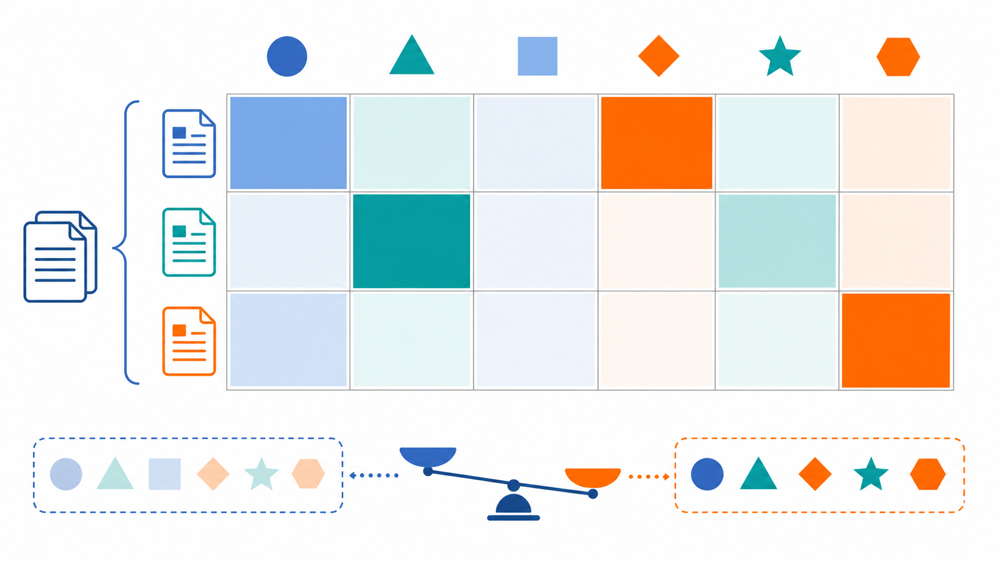

그림에서 여러 문서에 공통으로 나타나는 열은 흐려지고 특정 문서에서 두드러지는 셀은 진해진다. 이는 등장 횟수를 없애는 것이 아니라 문서 집합 전체의 희귀도를 반영해 가중치를 조정한 결과이다.

### 단어 N-gram: 일부 어순을 특성에 포함한다

**단어 N-gram** 은 연속한 $n$개 토큰을 특성 하나로 묶는다. `좋지`와 `않다`를 따로 세는 대신 `좋지 않다` 같은 묶음을 특성으로 만들면 짧은 순서를 일부 보존할 수 있다. N-gram은 새로운 벡터 종류가 아니라 BoW·TF-IDF에서 무엇을 열 하나로 셀지 정하는 특성 구성 방식이다.

$n=1$이면 unigram, $n=2$이면 bigram, $n=3$이면 trigram이다. $n$이 커질수록 더 긴 순서를 보존하지만 가능한 조합 수가 빠르게 늘어 벡터 차원이 커지고, 학습 데이터에 없던 조합이 자주 발생한다.

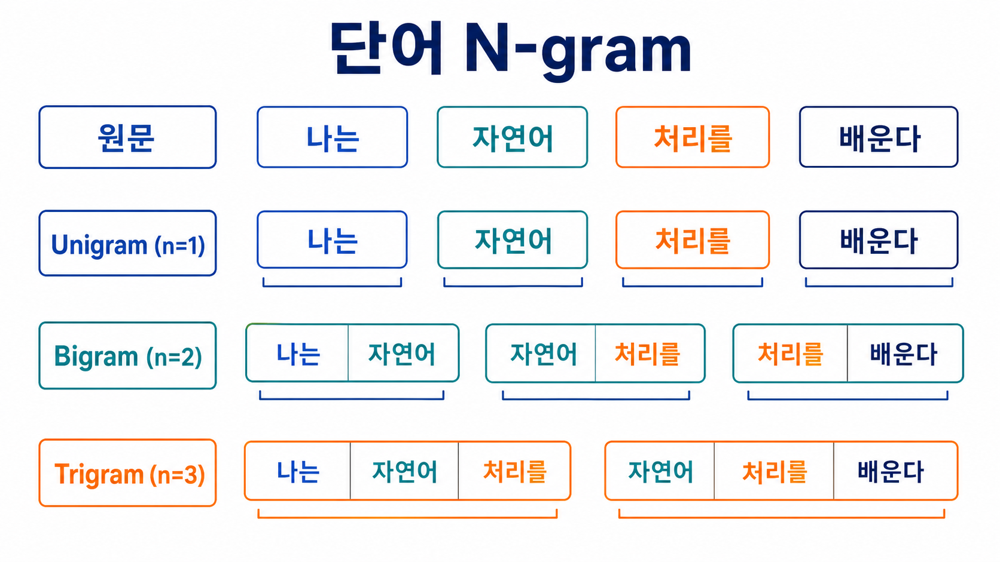

그림의 겹치는 묶음은 토큰 하나만 세는 대신 이웃한 두 개 또는 세 개 토큰의 순서를 특성으로 추가하는 과정을 나타낸다.

```text
문서 → 단어 횟수 계산                 → BoW
     → 전체 문서 희귀도까지 가중       → TF-IDF
     → 연속 단어 묶음을 특성으로 추가  → 단어 N-gram
```

세 방법은 문서에 어떤 표현이 사용됐는지는 잘 보여 주지만 `고양이`와 `강아지`의 의미가 가깝다는 관계를 직접 학습하지 못한다. 이 한계를 보완하기 위해 단어 의미를 여러 실수 차원에 나누어 담는 임베딩으로 이동한다.

## 04. 단어 의미를 표현하는 정적 임베딩(Word2Vec, GloVe, FastText)

원-핫 벡터는 단어를 서로 다른 ID 위치로 구분하지만 모든 단어 쌍을 비슷하게 멀리 떨어뜨린다.
**단어 임베딩(Word Embedding)** 은 비슷한 문맥에 등장한 단어가 가까워지도록 단어마다 짧은 밀집 벡터를 학습한다.

### 원-핫: 단어를 서로 다른 위치로 구분한다

**원-핫 벡터(One-Hot Vector)** 는 어휘 크기만큼의 위치를 만들고 단어 ID에 해당하는 한 위치만 1, 나머지는 0으로 표시한다. 단어를 서로 구분하는 기준은 분명하지만 어휘가 커질수록 벡터가 길어지고, 서로 다른 단어 벡터 사이의 의미 관계는 표현하지 못한다.

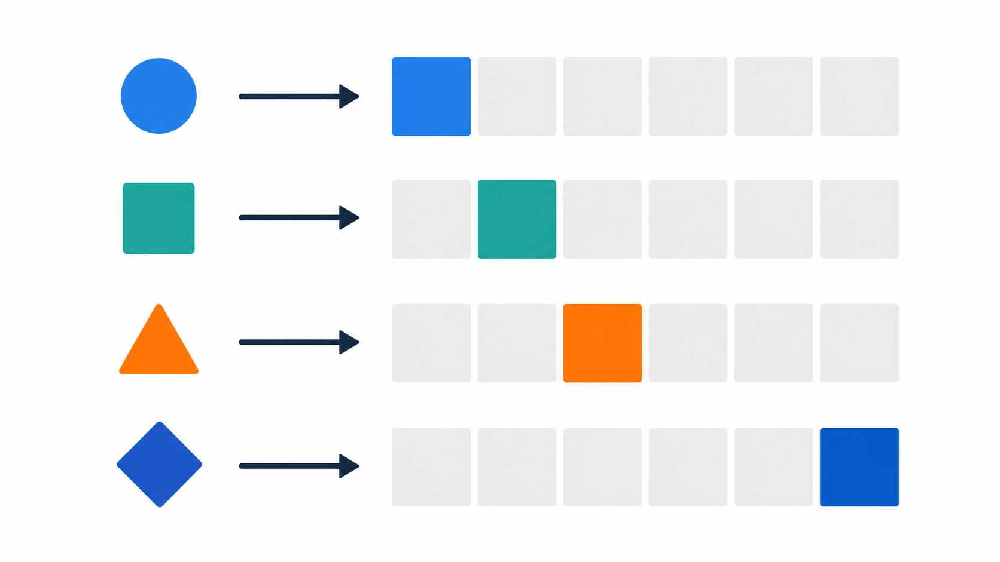

그림에서 각 토큰은 같은 길이의 벡터를 사용하지만 활성화된 위치가 다르다. 위치는 단어의 ID를 구분할 뿐, 활성화된 칸 사이의 거리가 단어 의미를 나타내지는 않는다.

### 임베딩은 벡터화의 한 종류이다

**임베딩(Embedding)** 은 토큰·단어·문서처럼 이산적인 대상을 비교적 짧은 연속 실수 벡터에 매핑하는 표현이다. NLP에서는 일반적으로 데이터와 학습 목표를 통해 그 값을 학습한다. 모든 임베딩은 텍스트를 숫자로 바꾸므로 벡터화에 포함되지만, BoW·TF-IDF처럼 정해진 규칙으로 값을 계산하는 모든 벡터화를 임베딩이라고 부르지는 않는다.

단어 임베딩은 일반적으로 `(어휘 수, 임베딩 차원)` 크기의 **임베딩 행렬**로 이해할 수 있다. 정수 단어 ID는 이 행렬의 행 하나를 선택하고, 선택된 행의 실수 값들이 해당 단어의 벡터가 된다. 임베딩 차원은 어휘 수와 독립적으로 정하므로 원-핫보다 짧은 벡터를 사용할 수 있다.

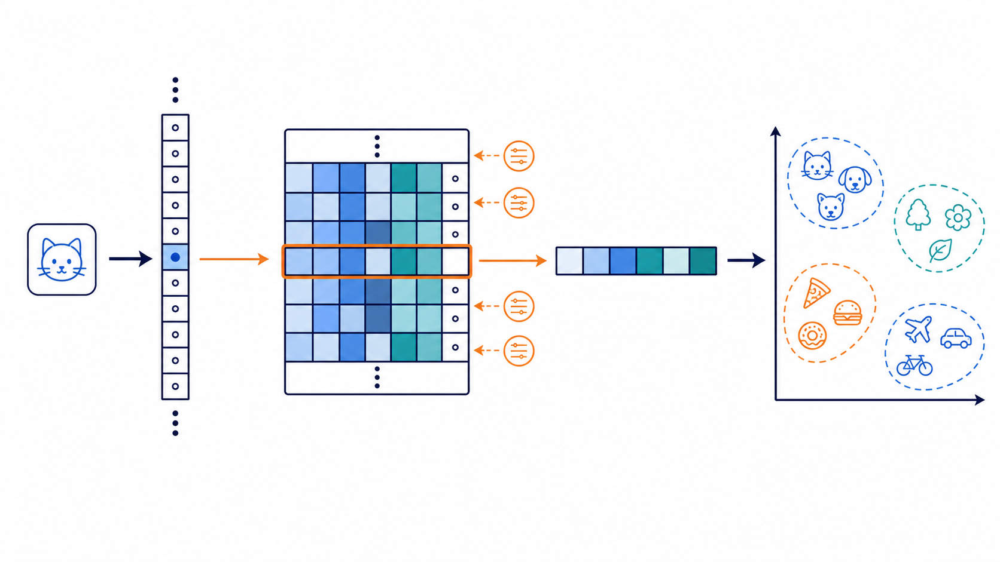

임베딩 행렬을 임의의 값으로 초기화한 시점에는 의미를 담고 있지 않다. 주변 단어 예측이나 분류 손실 같은 학습 목표를 통해 행렬의 값이 갱신되면서 비슷한 사용 맥락을 가진 대상이 가까운 위치에 놓이게 된다. 대규모 말뭉치에서 미리 학습한 벡터를 가져오면 **사전 학습 임베딩**, 현재 작업의 손실로 함께 학습하면 **과업 학습 임베딩**이라고 구분할 수 있다.

PyTorch의 **`nn.Embedding`** 은 정수 ID로 임베딩 행렬의 행을 조회하고 그 값을 학습할 수 있게 만든 계층이다. `nn.Embedding` 자체가 Word2Vec 같은 학습 알고리즘은 아니며, 어떤 손실함수로 행렬을 학습하느냐에 따라 벡터가 담는 정보가 달라진다. 학습된 각 차원도 보통 `성별`, `감정`, `주제`처럼 사람이 한 단어로 직접 이름 붙이는 축이 아니라 여러 관계가 분산된 잠재 축이다.

밀집 벡터라는 모양만으로 의미 관계가 보장되지는 않는다. 어떤 데이터와 학습 목표로 값을 학습했는지가 임베딩이 담는 정보를 결정한다.

아래 세 모델은 학습 신호는 다르지만 문맥이 바뀌어도 등록 단어 하나에 고정 벡터 하나를 사용한다는 공통점이 있다. 이를 **정적 임베딩(Static Embedding)** 이라고 한다.

### Word2Vec: 중심 단어와 주변 단어의 예측 관계를 학습한다

**Word2Vec** 은 가까운 위치에 등장하는 중심 단어와 주변 단어를 예측하며 임베딩을 학습한다. CBOW와 Skip-gram은 예측 방향이 다르지만 모두 주변 문맥을 학습 신호로 사용한다.

- **CBOW(Continuous Bag of Words)**: 여러 주변 단어로 중심 단어를 예측하는 방식
- **Skip-gram**: 중심 단어로 여러 주변 단어를 예측하는 방식
- **윈도우(Window)**: 중심 단어의 앞뒤에서 학습 문맥으로 사용할 범위

예측을 잘하도록 가중치를 반복해서 갱신한 뒤 임베딩 행렬의 행을 단어 벡터로 사용한다. 비슷한 주변 단어와 함께 등장한 단어는 비슷한 예측을 해야 하므로 벡터 공간에서도 가까워지는 경향이 있다.

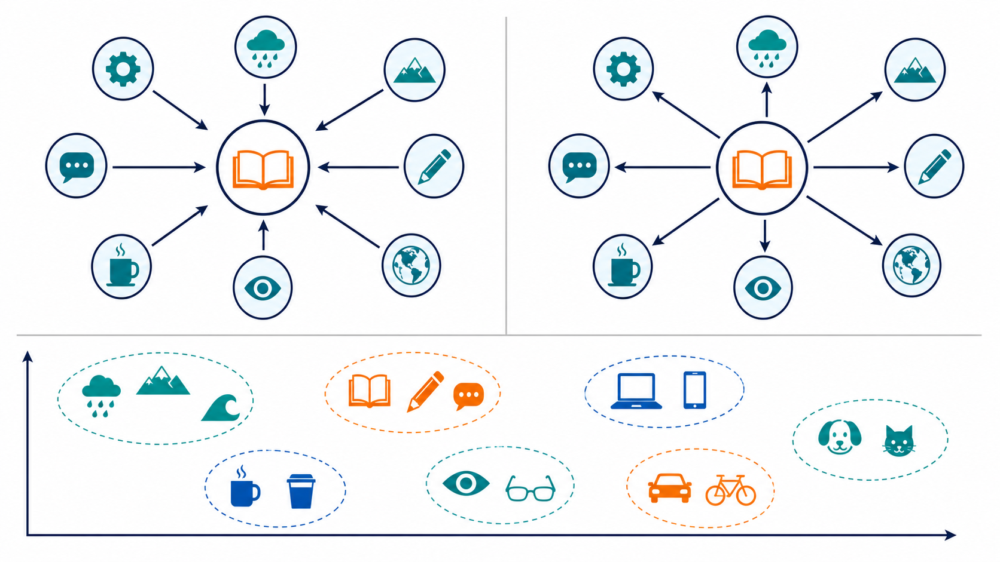

그림의 양쪽 흐름은 주변 단어에서 중심 단어를 예측하는 CBOW와 중심 단어에서 주변 단어를 예측하는 Skip-gram의 방향 차이를 나타낸다.

### GloVe: 코퍼스 전체의 동시 등장 통계를 사용한다

**GloVe(Global Vectors for Word Representation)** 는 코퍼스 전체에서 단어가 함께 등장한 횟수와 확률 비율을 벡터 관계로 설명하도록 학습한다. Word2Vec이 가까운 문맥의 예측을 반복한다면 GloVe는 전체 동시 등장 통계를 직접 활용한다.

먼저 일정한 윈도우 안에서 두 단어가 함께 나온 횟수를 모아 **동시 등장 행렬(Co-occurrence Matrix)** 을 만든다. 그다음 자주 함께 나타나는 관계와 단어 쌍 사이의 통계적 차이가 벡터의 내적 관계에 반영되도록 학습한다. 결과는 Word2Vec처럼 단어마다 하나의 정적 밀집 벡터이다.

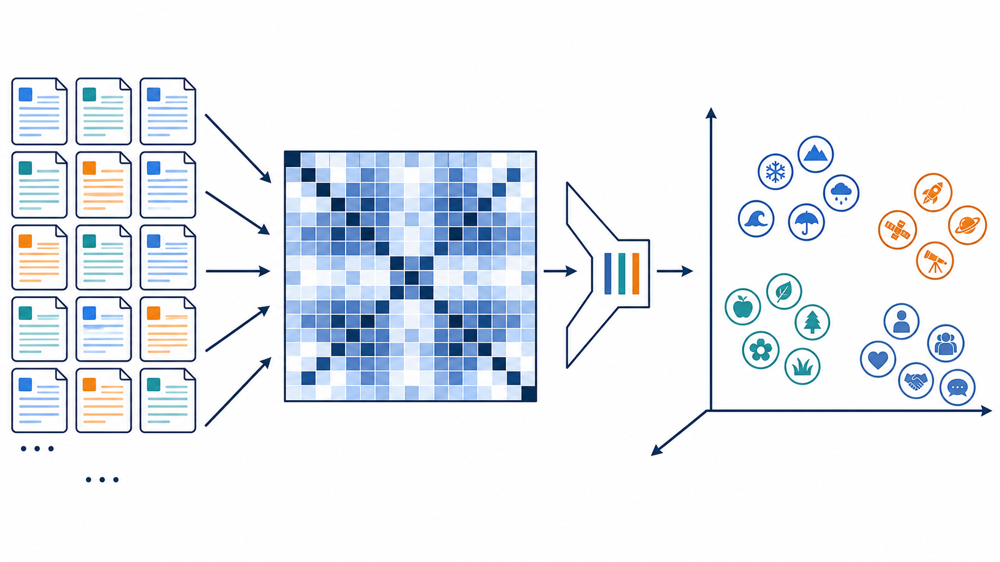

그림의 큰 격자는 말뭉치 전체에서 모은 동시 등장 통계이고, 오른쪽의 가까운 점들은 이 통계가 반영되도록 학습된 단어 관계를 나타낸다.

### FastText: 문자 N-gram으로 단어 내부 정보까지 사용한다

**FastText** 는 단어 전체 벡터와 문자 N-gram 벡터를 조합한다. 학습 어휘에 없는 단어도 이미 학습한 문자 조각으로 벡터를 구성할 수 있어 활용·파생·복합어와 철자 변형에 유리하다.

단어를 경계 기호가 포함된 여러 문자 조각으로 나누고 각 조각의 벡터를 학습한다. 단어 벡터는 관련 문자 조각 벡터를 합쳐 구성하므로 완전히 같은 철자를 본 적이 없어도 학습한 조각을 공유하면 근사 벡터를 만들 수 있다. 다만 문자 형태가 비슷하다는 사실이 항상 의미가 비슷함을 보장하지는 않는다.

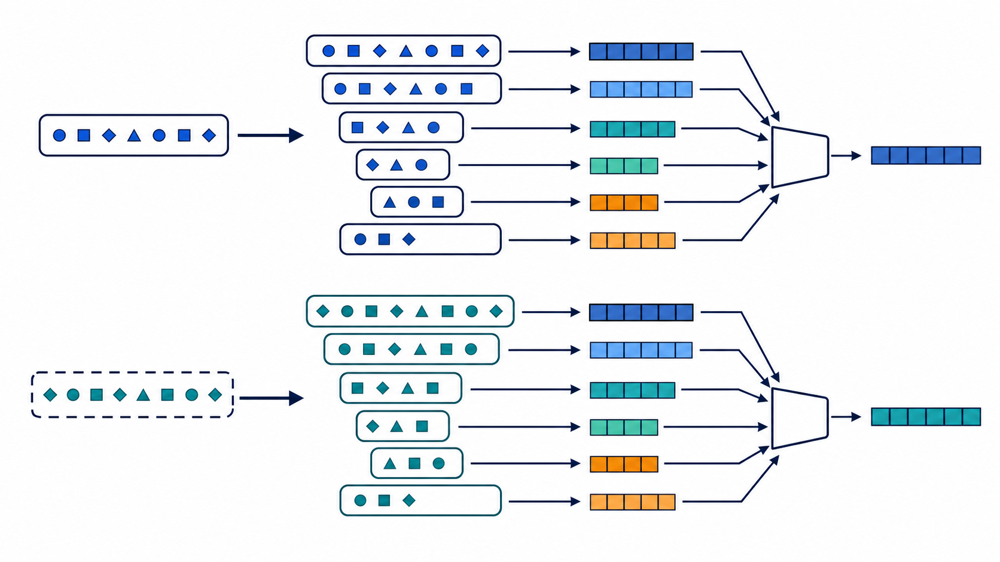

그림은 한 단어 안의 겹치는 문자 조각들이 각각 벡터를 제공하고, 공유 조각을 이용해 처음 보는 단어의 벡터도 구성하는 과정을 나타낸다.

앞 절의 단어 N-gram은 `좋지 않다`처럼 여러 토큰을 하나의 문서 특성으로 묶는다. FastText의 문자 N-gram은 `apple` 내부의 `app`, `ppl`처럼 한 단어를 문자 조각으로 나눈다. 이름은 같지만 적용 단위와 목적이 다르다.

정적 임베딩은 단어 유사도를 표현할 수 있지만 `은행`이 금융기관인지 은행나무 열매인지 문장마다 구분하지 못한다. 같은 표면 단어에 항상 같은 벡터를 주는 한계를 해결하려면 문맥적 표현이 필요하다.

## 05. 문맥과 문서 전체를 표현하는 방법(BERT, Doc2Vec)

BERT와 Doc2Vec은 모두 밀집 벡터를 만들지만 같은 문제를 해결하는 모델로 서로 대체할 수 없다. BERT는 문장 안의 토큰을 문맥에 맞게 표현하고, Doc2Vec은 문서 전체를 고정 길이 벡터 하나로 표현한다.

### BERT: 같은 토큰도 문맥에 따라 다르게 표현한다

**BERT가 출력하는 문맥적 토큰 표현** 은 토큰의 왼쪽과 오른쪽 문맥을 함께 반영한다. `은행 계좌를 만들었다`의 `은행`과 `은행 열매를 구웠다`의 `은행`처럼 같은 표면 토큰이 다른 의미로 사용되면 서로 다른 토큰 벡터가 만들어진다. BERT가 토큰별 문맥 벡터를 반환한다고 해서 문서 벡터 하나가 자동으로 만들어지는 것은 아니며, 문서 표현에는 `[CLS]` 또는 토큰 벡터를 결합하는 별도 방법이 필요하다.

BERT는 입력 토큰 사이의 관계를 **Self-Attention** 으로 계산하여 각 토큰 벡터에 문장 전체의 관련 정보를 섞는다. Word2Vec·GloVe·FastText가 단어마다 하나의 벡터를 저장하는 정적 임베딩이라면, BERT는 문장을 입력할 때마다 각 위치의 벡터를 다시 계산하는 **문맥적 임베딩(Contextual Embedding)** 이다.

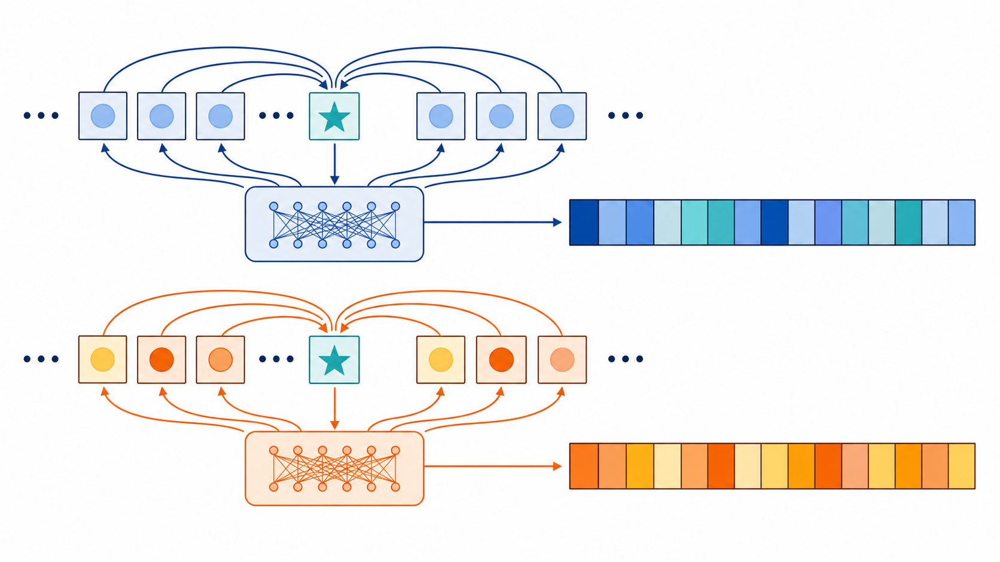

그림에서 같은 중심 토큰이 서로 다른 앞뒤 토큰과 연결된 뒤 다른 색과 방향의 벡터로 변한다. 이 차이가 같은 표면 단어의 문맥별 의미를 구분하는 핵심이다.

BERT 계열 모델은 문맥 표현력이 높지만 정적 임베딩보다 계산량과 메모리 사용량이 크다. 또한 `[CLS]`, 평균 풀링, 별도 문장 임베딩 모델은 문서 벡터를 만드는 방식과 학습 목표가 다르므로 작업 성능으로 비교해야 한다.

### Doc2Vec: 문서 ID를 함께 학습한다

**Doc2Vec** 은 단어와 함께 문서 ID 벡터를 학습해 길이가 다른 문장·문단·문서를 같은 차원의 벡터로 만든다. 문서 유사도·검색·군집처럼 문서 전체의 관계를 비교할 때 사용할 수 있다.

학습 데이터의 각 문서에는 고유한 문서 태그가 붙고, 모델은 단어 벡터와 함께 문서 태그의 벡터를 갱신한다. 학습에 없던 새 문서는 단어 벡터와 모델 파라미터를 고정한 채 새 문서 벡터를 추론하는 절차가 필요하다.

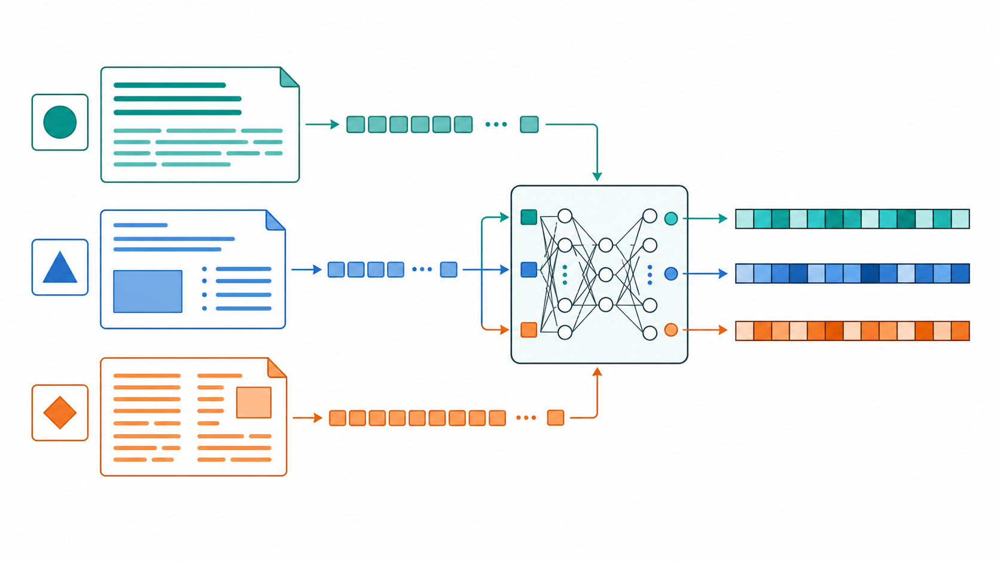

그림의 문서별 표식은 단어만으로는 구분되지 않는 문서 고유 정보를 학습에 함께 넣고, 길이가 다른 문서를 같은 차원의 벡터로 만드는 역할을 나타낸다.

- **PV-DM(Distributed Memory)**: 문서 벡터와 주변 단어를 함께 사용해 중심 단어를 예측하는 방식
- **PV-DBOW(Distributed Bag of Words)**: 문서 벡터를 사용해 해당 문서의 단어를 예측하는 방식

BERT를 선택할지는 문맥에 따라 달라지는 토큰 의미가 필요한지로 판단하고, Doc2Vec을 선택할지는 문서 전체를 벡터 하나로 직접 비교해야 하는지로 판단한다.

## 06. 문서-단어 행렬에서 잠재 구조를 찾는다: LSA와 LDA

BoW와 TF-IDF는 열마다 실제 단어가 대응하므로 해석하기 쉽지만 어휘가 커지면 차원이 증가한다. LSA와 LDA는 문서-단어 행렬에서 반복되는 관계를 이용해 더 적은 수의 잠재 축이나 잠재 주제로 문서를 표현한다.

### LSA: 행렬을 저차원 실수 공간으로 분해한다

**LSA(Latent Semantic Analysis)** 는 문서-단어 행렬을 SVD로 분해해 문서와 단어를 저차원 잠재 공간에 나타낸다. 출력 축은 여러 단어의 관계가 섞인 실수 방향이며 음수도 포함할 수 있으므로 각 축을 확률로 해석하지 않는다.

**SVD(Singular Value Decomposition)** 는 큰 행렬을 관계가 강한 방향부터 여러 행렬로 분해하는 방법이다. 중요한 잠재 방향 일부만 남기면 원래 어휘 수보다 적은 차원으로 문서를 표현할 수 있고, 비슷한 단어 사용 패턴을 가진 문서가 가까워질 수 있다. 다만 잠재 축 하나에 여러 단어 관계가 섞이므로 축의 뜻이 명확한 주제 이름으로 바로 해석되지는 않는다.

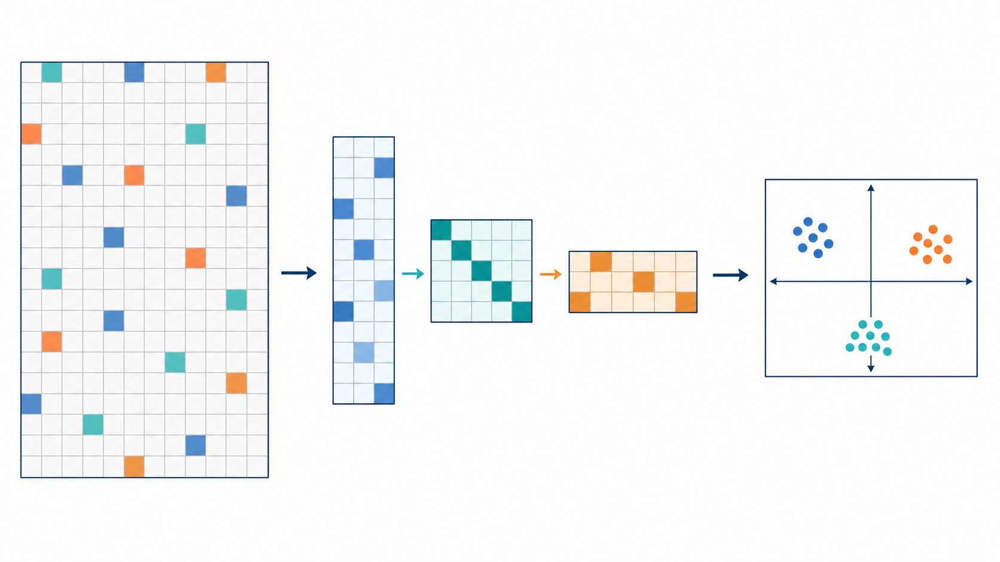

그림은 큰 문서-단어 행렬을 주요 관계만 남긴 작은 좌표 공간으로 압축하는 과정을 나타낸다. 오른쪽의 가까운 문서 점은 잠재 단어 사용 패턴이 비슷함을 뜻한다.

### LDA: 문서를 잠재 주제의 확률 혼합으로 설명한다

**LDA(Latent Dirichlet Allocation)** 는 음수가 없는 문서-단어 빈도 행렬을 입력받아 각 문서를 여러 주제의 혼합으로, 각 주제를 여러 단어의 확률 분포로 설명한다. 문서-주제 벡터의 한 행은 합이 약 1인 주제 비율이다.

LDA는 문서가 먼저 여러 주제의 비율을 선택하고, 각 단어가 선택된 주제의 단어 분포에서 생성되었다고 가정하는 확률 모형이다. 분석자는 주제 수를 미리 정하며, 학습 후 각 주제에서 확률이 높은 단어들을 함께 읽어 주제의 의미를 해석한다. 단어 순서는 사용하지 않으므로 긴 문맥이나 문장 구조까지 표현하지 않는다.

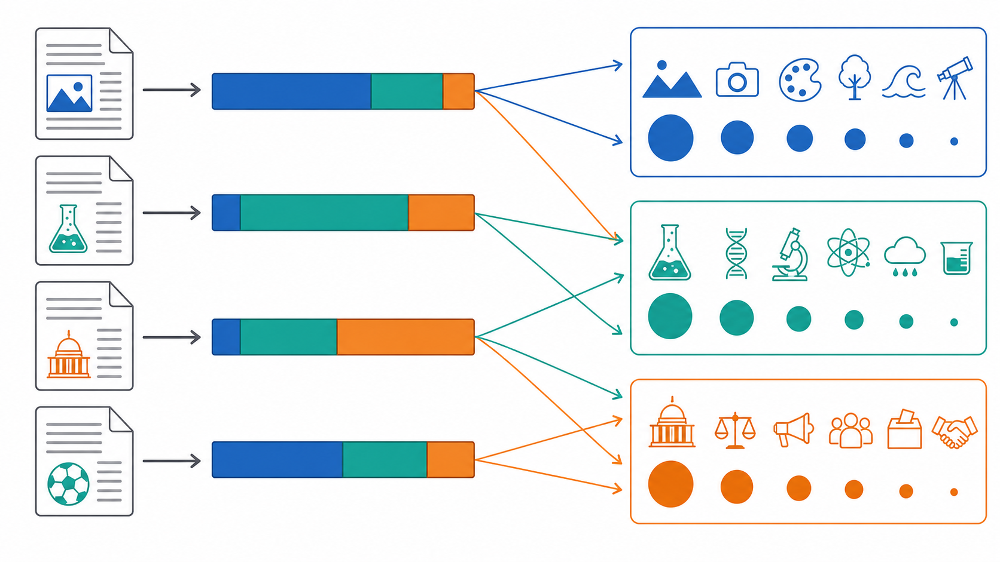

그림의 문서별 색 비율은 문서-주제 분포를, 각 색과 연결된 단어 아이콘 묶음은 주제-단어 분포를 나타낸다.

LSA는 문서를 잠재 실수 좌표로 압축하고, LDA는 문서를 해석 가능한 주제 비율로 나타낸다. LDA의 주목적은 단어 임베딩이 아니라 토픽 모델링이지만, 문서의 어휘 축이 주제 확률 축으로 바뀌는 과정을 보여 주므로 벡터화 흐름의 마지막에 배치한다.

여기서 LDA는 분류에서 사용하는 Linear Discriminant Analysis가 아니라 Latent Dirichlet Allocation을 뜻한다. 두 모델은 약어만 같고 목적과 입력이 다르다.

## 07. 작업 목적에 따라 첫 번째 방법을 선택한다

벡터화 기법의 이름보다 먼저 표현 대상과 필요한 정보를 정한다. 아래 선택은 최종 정답이 아니라 가장 단순한 기준선에서 시작하기 위한 첫 후보이다.

- 빠르고 해석 가능한 문서 분류 기준선이 필요하면 BoW·TF-IDF를 먼저 고려한다.
- 짧은 어순을 빈도 특성에 포함하려면 단어 N-gram을 추가한다.
- 단어 유사도와 가벼운 정적 의미 표현이 필요하면 Word2Vec·GloVe를 고려한다.
- 미등록 단어와 형태 변화가 많으면 FastText를 고려한다.
- 같은 토큰의 의미가 문맥에 따라 달라져야 하면 BERT 계열의 문맥적 표현을 고려한다.
- 문서 전체를 고정 길이 밀집 벡터로 비교하려면 Doc2Vec을 고려한다.
- 문서-단어 행렬을 저차원 실수 공간으로 압축하려면 LSA를 고려한다.
- 문서 집합의 잠재 주제와 문서별 주제 비율을 해석하려면 LDA를 고려한다.

```text
텍스트 벡터화
├─ 문서의 단어 사용을 직접 표현
│  └─ BoW · TF-IDF · 단어 N-gram
├─ 단어 의미를 정적 벡터로 표현
│  └─ Word2Vec · GloVe · FastText
├─ 문맥 또는 문서 전체를 밀집 벡터로 표현
│  ├─ 문맥적 토큰: BERT
│  └─ 문서 전체: Doc2Vec
└─ 문서 집합의 잠재 구조를 표현
   ├─ 잠재 실수축: LSA
   └─ 주제 확률분포: LDA
```

최종 선택 전에는 세 질문을 다시 확인한다. 벡터 한 개가 무엇을 나타내는지, 어떤 정보를 보존해야 하는지, 데이터 크기·해석 가능성·OOV·계산 비용 중 어떤 제약이 중요한지를 확인한 뒤 실제 작업 성능으로 비교한다.